In [1]:
import pandas as pd
import os
import re 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%%time
import nltk
nltk.download('omw-1.4')
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score

from tqdm import tqdm, tqdm_notebook
from wordcloud import WordCloud

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import gensim
from gensim.models import Word2Vec, KeyedVectors
import gensim.downloader as api
from sentence_transformers import SentenceTransformer, util

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\7240\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Wall time: 8.04 s


In [3]:
%%time
dir_path = r"C:\Users\7240\Downloads\txt_reviews\txt_reviews"

files = os.listdir(dir_path)

print(files)

['review_1.txt', 'review_10.txt', 'review_100.txt', 'review_1000.txt', 'review_10000.txt', 'review_100000.txt', 'review_100001.txt', 'review_100002.txt', 'review_100003.txt', 'review_100004.txt', 'review_100005.txt', 'review_100006.txt', 'review_100007.txt', 'review_100008.txt', 'review_100009.txt', 'review_10001.txt', 'review_100010.txt', 'review_100011.txt', 'review_100012.txt', 'review_100013.txt', 'review_100014.txt', 'review_100015.txt', 'review_100016.txt', 'review_100017.txt', 'review_100018.txt', 'review_100019.txt', 'review_10002.txt', 'review_100020.txt', 'review_100021.txt', 'review_100022.txt', 'review_100023.txt', 'review_100024.txt', 'review_100025.txt', 'review_100026.txt', 'review_100027.txt', 'review_100028.txt', 'review_100029.txt', 'review_10003.txt', 'review_100030.txt', 'review_100031.txt', 'review_100032.txt', 'review_100033.txt', 'review_100034.txt', 'review_100035.txt', 'review_100036.txt', 'review_100037.txt', 'review_100038.txt', 'review_100039.txt', 'review_1

In [4]:
%%time
#Appending all 500000 text file content in a list
l = []
for file in files:
    file_path = dir_path + '/' + file
    with open(file_path, encoding="utf8") as f :
        file_content = f.read()
    #file_content = filename.read()
    l.append(file_content)

Wall time: 1h 33min 25s


In [5]:
l

['ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\nProfileName: delmartian\nHelpfulnessNumerator: 1\nHelpfulnessDenominator: 1\nScore: 5\nTime: 1303862400\nReviewSummary: Good Quality Dog Food\nReviewText: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.\n',
 'ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\nProfileName: Carol A. Reed\nHelpfulnessNumerator: 0\nHelpfulnessDenominator: 0\nScore: 5\nTime: 1351209600\nReviewSummary: Healthy Dog Food\nReviewText: This is a very healthy dog food. Good for their digestion. Also good for small puppies. My dog eats her required amount at every feeding.\n',
 "ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\nProfileName: Melissa Benjamin\nHelpfulnessNumerator: 0\nHelpfulnessDenominator: 1\nScore: 1\nTime: 1331164800\nReviewSummary: Bad\nRevi

In [6]:
df=pd.DataFrame(l)

In [7]:
df.head()

,0
0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...
1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...
2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...
3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...
4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...


In [8]:
#spliting the data into different columns and splitting at /n
df[['ProductId','UserId','ProfileName','HelpfulnessNumerator','HelpfulnessDenominator','Score','Time','ReviewSummary','ReviewText','empty']]=df[0].str.split('\n',expand=True)

In [9]:
df.head()

,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText,empty
0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,ProductId: B001E4KFG0,UserId: A3SGXH7AUHU8GW,ProfileName: delmartian,HelpfulnessNumerator: 1,HelpfulnessDenominator: 1,Score: 5,Time: 1303862400,ReviewSummary: Good Quality Dog Food,ReviewText: I have bought several of the Vital...,
1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,ProductId: B00171APVA,UserId: A21BT40VZCCYT4,ProfileName: Carol A. Reed,HelpfulnessNumerator: 0,HelpfulnessDenominator: 0,Score: 5,Time: 1351209600,ReviewSummary: Healthy Dog Food,ReviewText: This is a very healthy dog food. G...,
2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,ProductId: B0019CW0HE,UserId: A2P6ACFZ8FTNVV,ProfileName: Melissa Benjamin,HelpfulnessNumerator: 0,HelpfulnessDenominator: 1,Score: 1,Time: 1331164800,ReviewSummary: Bad,ReviewText: I fed this to my Golden Retriever ...,
3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,ProductId: B006F2NYI2,UserId: A132DJVI37RB4X,ProfileName: Scottdrum,HelpfulnessNumerator: 2,HelpfulnessDenominator: 5,Score: 2,Time: 1332374400,"ReviewSummary: Not hot, not habanero","ReviewText: I have to admit, I was a sucker fo...",
4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,ProductId: B000P41A28,UserId: A82WIMR4RSVLI,ProfileName: Emrose mom,HelpfulnessNumerator: 0,HelpfulnessDenominator: 1,Score: 4,Time: 1337472000,ReviewSummary: The best weve tried so far,ReviewText: We have a 7 week old... He had gas...,


In [10]:
df.shape

(568454, 11)

In [11]:
df.columns

Index([                       0,              'ProductId',
                       'UserId',            'ProfileName',
         'HelpfulnessNumerator', 'HelpfulnessDenominator',
                        'Score',                   'Time',
                'ReviewSummary',             'ReviewText',
                        'empty'],
      dtype='object')

In [12]:
df['ProductId'] = df.ProductId.str.split(':').str[1]
df['UserId'] = df.UserId.str.split(':').str[1]
df['ProfileName'] = df.ProfileName.str.split(':').str[1]
df['HelpfulnessNumerator'] = df.HelpfulnessNumerator.str.split(':').str[1]
df['Score'] = df.Score.str.split(':').str[1]
df['Time'] = df.Time.str.split(':').str[1]
df['ReviewSummary'] = df.ReviewSummary.str.split(':').str[1]
df['ReviewText'] = df.ReviewText.str.split(':').str[1]
df['HelpfulnessDenominator'] = df.HelpfulnessDenominator.str.split(':').str[1]



In [13]:
df.head()

,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText,empty
0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,
1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,
2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,
3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...",
4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,


In [14]:
df.drop('empty' , axis = 1 , inplace = True)
df

,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...
...,...,...,...,...,...,...,...,...,...,...
568449,ProductId: B000LQORDE\nUserId: AL22WN8RBBOW7\n...,B000LQORDE,AL22WN8RBBOW7,"LifeInTheCity ""trogg""",2,5,5,1256428800,Good Stuff,I love these noodle. A little to spicy for t...
568450,ProductId: B000LQORDE\nUserId: A2P7HIRYYWVOBD\...,B000LQORDE,A2P7HIRYYWVOBD,Mason,2,5,5,1254096000,yummy!,I just love it and will buy another box when ...
568451,ProductId: B000LQORDE\nUserId: A1K0ZH5MQFBA77\...,B000LQORDE,A1K0ZH5MQFBA77,jennilight,2,5,4,1250985600,Tastes like More!,My late father in law used to have a rating s...
568452,ProductId: B000LQORDE\nUserId: A29FRN2O7LWINL\...,B000LQORDE,A29FRN2O7LWINL,T. Tsai,2,5,5,1237766400,Great ramen,This is my favorite brand of Korean ramen. It...


In [15]:
df.shape

(568454, 10)

# Save in CSV file

In [16]:
df.to_csv("Final_df_NLP.csv")

In [17]:
df.head()

,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...


In [18]:
df = pd.read_csv("Final_df_NLP.csv")

In [19]:
df.head()

,Unnamed: 0,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,0,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,1,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,2,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,3,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,4,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...


In [20]:
df = df.drop("Unnamed: 0",axis=1)

In [21]:
df.insert(0, "ID", value = range(1,568455))
df

,ID,0,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,1,ProductId: B001E4KFG0\nUserId: A3SGXH7AUHU8GW\...,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,2,ProductId: B00171APVA\nUserId: A21BT40VZCCYT4\...,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,3,ProductId: B0019CW0HE\nUserId: A2P6ACFZ8FTNVV\...,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,4,ProductId: B006F2NYI2\nUserId: A132DJVI37RB4X\...,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,5,ProductId: B000P41A28\nUserId: A82WIMR4RSVLI\n...,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...
...,...,...,...,...,...,...,...,...,...,...,...
568449,568450,ProductId: B000LQORDE\nUserId: AL22WN8RBBOW7\n...,B000LQORDE,AL22WN8RBBOW7,"LifeInTheCity ""trogg""",2,5,5,1256428800,Good Stuff,I love these noodle. A little to spicy for t...
568450,568451,ProductId: B000LQORDE\nUserId: A2P7HIRYYWVOBD\...,B000LQORDE,A2P7HIRYYWVOBD,Mason,2,5,5,1254096000,yummy!,I just love it and will buy another box when ...
568451,568452,ProductId: B000LQORDE\nUserId: A1K0ZH5MQFBA77\...,B000LQORDE,A1K0ZH5MQFBA77,jennilight,2,5,4,1250985600,Tastes like More!,My late father in law used to have a rating s...
568452,568453,ProductId: B000LQORDE\nUserId: A29FRN2O7LWINL\...,B000LQORDE,A29FRN2O7LWINL,T. Tsai,2,5,5,1237766400,Great ramen,This is my favorite brand of Korean ramen. It...


In [22]:
df.columns

Index(['ID', '0', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'ReviewSummary',
       'ReviewText'],
      dtype='object')

In [23]:
df = df.drop("0",axis=1)
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...


In [24]:
df.to_csv("Final_df_NLP_Final.csv")

In [25]:
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large..."
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...


# Null values

In [26]:
df.isnull().sum()

ID                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
ReviewSummary             0
ReviewText                0
dtype: int64

# DType

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   ID                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568454 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   ReviewSummary           568454 non-null  object
 9   ReviewText              568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB


# Finding duplicates

In [28]:
df[df.duplicated()]

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,ReviewSummary,ReviewText


In [29]:
df["Combine_Review"] = df['ReviewSummary'] +' ' + df['ReviewText']

In [30]:
df.insert(6, 'Helpfulness', df['HelpfulnessNumerator'] / df['HelpfulnessDenominator'])

In [31]:
#df["Helpfulness"] = df["Helpfulness_Numerator"] / df["Helpfulness_Denominator"]
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1.0,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,Good Quality Dog Food I have bought several ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,NaN,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,Healthy Dog Food This is a very healthy dog ...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,0.0,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,Bad I fed this to my Golden Retriever and he...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.4,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was..."
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,0.0,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,The best weve tried so far We have a 7 week ...


In [32]:
df.isnull().sum()

ID                             0
ProductId                      0
UserId                         0
ProfileName                    0
HelpfulnessNumerator           0
HelpfulnessDenominator         0
Helpfulness               270052
Score                          0
Time                           0
ReviewSummary                  0
ReviewText                     0
Combine_Review                 0
dtype: int64

In [33]:
df['Helpfulness'] = df['Helpfulness'].fillna(df['Helpfulness'].median())

In [34]:
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1.0,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,Good Quality Dog Food I have bought several ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,1.0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,Healthy Dog Food This is a very healthy dog ...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,0.0,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,Bad I fed this to my Golden Retriever and he...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.4,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was..."
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,0.0,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,The best weve tried so far We have a 7 week ...


In [35]:
df[df["HelpfulnessNumerator"]==2]

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.400000,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was..."
5,6,B000LQORDE,A19W47CXJJP1MI,Amazonian Consumer,2,5,0.400000,5,1235088000,"This spicy noodle cures my cold, upset stomac...",I love this noodle and have it once or twice ...,"This spicy noodle cures my cold, upset stomac..."
52,53,B000LQORDE,A3UYNCW0KQ5H6Z,TypeL,2,6,0.333333,5,1289174400,Great tasting Ramen for everyone!!,I gotta say it is less spicier than Korean-ma...,Great tasting Ramen for everyone!! I gotta s...
60,61,B000LQORDE,A7MXWFCWVXJZE,"H. Smith ""Beautacentric""",2,9,0.222222,5,1277251200,Good but...,"These are good, but the noodles are not much ...","Good but... These are good, but the noodles ..."
66,67,B000LQORDE,A22SXI0YD5D3DS,raymond,2,16,0.125000,2,1299369600,i haven't get my item...,i haven't get my item...i buy this item 2/17/...,i haven't get my item... i haven't get my it...
...,...,...,...,...,...,...,...,...,...,...,...,...
568449,568450,B000LQORDE,AL22WN8RBBOW7,"LifeInTheCity ""trogg""",2,5,0.400000,5,1256428800,Good Stuff,I love these noodle. A little to spicy for t...,Good Stuff I love these noodle. A little to...
568450,568451,B000LQORDE,A2P7HIRYYWVOBD,Mason,2,5,0.400000,5,1254096000,yummy!,I just love it and will buy another box when ...,yummy! I just love it and will buy another b...
568451,568452,B000LQORDE,A1K0ZH5MQFBA77,jennilight,2,5,0.400000,4,1250985600,Tastes like More!,My late father in law used to have a rating s...,Tastes like More! My late father in law used...
568452,568453,B000LQORDE,A29FRN2O7LWINL,T. Tsai,2,5,0.400000,5,1237766400,Great ramen,This is my favorite brand of Korean ramen. It...,Great ramen This is my favorite brand of Kor...


In [36]:
ps = PorterStemmer()
lemmatize = WordNetLemmatizer()

In [37]:
tqdm.pandas()

In [38]:
def clean_text(doc, stem=False):
    # Removing Special Characters
    doc = re.sub(r'[^A-z0-9 ]','',doc)
    doc = re.sub(r'_','',doc)
    # Convert to Lowercase
    doc = doc.lower()
    # Split the document into tokens
    doc_list = doc.split()
    # Correct the Spellings and removing stop words
    doc_list = [word for word in doc_list if word not in stopwords.words('english')]
    #doc_list = [str(TextBlob(word).correct()) for word in doc_list if word not in sw]
    # Convert to Singularize
    #doc_list = [str(Word(word).singularize()) for word in doc_list]
    
    return " ".join(doc_list)

In [39]:
df['Text_cleaned_lemma'] = df['Combine_Review'].progress_apply(clean_text ,stem=True)

100%|████████████████████████████████████████████████████████████████████████| 568454/568454 [4:00:58<00:00, 39.31it/s]


In [40]:
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review,Text_cleaned_lemma
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1.0,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,Good Quality Dog Food I have bought several ...,good quality dog food bought several vitality ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,1.0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,Healthy Dog Food This is a very healthy dog ...,healthy dog food healthy dog food good digesti...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,0.0,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,Bad I fed this to my Golden Retriever and he...,bad fed golden retriever hated wouldnt eat gav...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.4,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was...",hot habanero admit sucker large quantity 12 oz...
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,0.0,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,The best weve tried so far We have a 7 week ...,best weve tried far 7 week old gas constipatio...


In [41]:
df.to_csv("Lemma_processed_df.csv")

In [42]:
df = pd.read_csv("Lemma_processed_df.csv")

In [43]:
df = df.drop("Unnamed: 0" ,axis=1)
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review,Text_cleaned_lemma
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1.0,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,Good Quality Dog Food I have bought several ...,good quality dog food bought several vitality ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,1.0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,Healthy Dog Food This is a very healthy dog ...,healthy dog food healthy dog food good digesti...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,0.0,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,Bad I fed this to my Golden Retriever and he...,bad fed golden retriever hated wouldnt eat gav...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.4,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was...",hot habanero admit sucker large quantity 12 oz...
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,0.0,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,The best weve tried so far We have a 7 week ...,best weve tried far 7 week old gas constipatio...


In [44]:
df.shape

(568454, 13)

# Train Test Split

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
X_train , X_test , Y_train , Y_test = train_test_split(df["Text_cleaned_lemma"] , df['Score'] , test_size = 0.3 , random_state=100)

In [47]:
X_train.shape

(397917,)

In [48]:
X_test.shape

(170537,)

In [49]:
tv=TfidfVectorizer()

In [50]:
cv=CountVectorizer()

In [51]:
df.shape

(568454, 13)

# CountVector = Bag of Words

# TFIDFVectorizer = TFIDF

In [52]:
df.head()

,ID,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Helpfulness,Score,Time,ReviewSummary,ReviewText,Combine_Review,Text_cleaned_lemma
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1.0,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned ...,Good Quality Dog Food I have bought several ...,good quality dog food bought several vitality ...
1,2,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,1.0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for the...,Healthy Dog Food This is a very healthy dog ...,healthy dog food healthy dog food good digesti...
2,3,B0019CW0HE,A2P6ACFZ8FTNVV,Melissa Benjamin,0,1,0.0,1,1331164800,Bad,I fed this to my Golden Retriever and he hate...,Bad I fed this to my Golden Retriever and he...,bad fed golden retriever hated wouldnt eat gav...
3,4,B006F2NYI2,A132DJVI37RB4X,Scottdrum,2,5,0.4,2,1332374400,"Not hot, not habanero","I have to admit, I was a sucker for the large...","Not hot, not habanero I have to admit, I was...",hot habanero admit sucker large quantity 12 oz...
4,5,B000P41A28,A82WIMR4RSVLI,Emrose mom,0,1,0.0,4,1337472000,The best weve tried so far,We have a 7 week old... He had gas and consti...,The best weve tried so far We have a 7 week ...,best weve tried far 7 week old gas constipatio...


In [53]:
%%time
X_train_bow = cv.fit_transform(X_train)
X_train_tfidf = tv.fit_transform(X_train)

Wall time: 35.9 s


In [54]:
%%time
X_test_bow = cv.transform(X_test)
X_test_tfidf = tv.transform(X_test)

Wall time: 15 s


In [55]:
X_train_bow

<397917x181768 sparse matrix of type '<class 'numpy.int64'>'
	with 13208524 stored elements in Compressed Sparse Row format>

In [56]:
X_train_tfidf

<397917x181768 sparse matrix of type '<class 'numpy.float64'>'
	with 13208524 stored elements in Compressed Sparse Row format>

In [57]:
X_test_bow

<170537x181768 sparse matrix of type '<class 'numpy.int64'>'
	with 5598857 stored elements in Compressed Sparse Row format>

In [58]:
X_test_tfidf

<170537x181768 sparse matrix of type '<class 'numpy.float64'>'
	with 5598857 stored elements in Compressed Sparse Row format>

# Building Model # Bag of words

# 1. MultinomialNB using BOW

In [59]:
mnb = MultinomialNB()

In [60]:
%%time
mnb.fit(X_train_bow , Y_train)

Wall time: 466 ms


MultinomialNB()

In [61]:
y_pred_mnb = mnb.predict(X_test_bow)
y_pred_mnb

array([5, 4, 5, ..., 4, 5, 5], dtype=int64)

In [62]:
# Bow
accuracy_score(Y_test,y_pred_mnb)

0.7364560183420606

In [63]:
pd.crosstab(Y_test, y_pred_mnb, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,10674,752,827,711,2587
2,2208,1730,1363,1267,2351
3,1450,317,3976,2983,3997
4,825,110,871,9524,12808
5,1809,197,736,6775,99689


# 2. DECISION TREE

In [64]:
%%time
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
dtc.fit(X_train_bow,Y_train)

Wall time: 56min 46s


DecisionTreeClassifier()

In [65]:
y_pred_dtc=dtc.predict(X_test_bow)
y_pred_dtc

array([5, 5, 4, ..., 5, 5, 5], dtype=int64)

In [66]:
accuracy_score(Y_test , y_pred_dtc)

0.7622979177539185

In [67]:
pd.crosstab(Y_test, y_pred_dtc, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,10222,1005,860,802,2662
2,1281,4020,778,749,2091
3,1032,715,6274,1428,3274
4,850,614,1331,12259,9084
5,2194,1313,2113,6361,97225


# 3. RANDOM FOREST

In [68]:
%%time
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_jobs=-1)
rfc.fit(X_train_bow,Y_train)

Wall time: 1h 19min 25s


RandomForestClassifier(n_jobs=-1)

In [69]:
y_pred_rfc = rfc.predict(X_test_bow)
y_pred_rfc

array([5, 5, 5, ..., 5, 5, 5], dtype=int64)

In [70]:
from sklearn.metrics import accuracy_score, classification_report

print(accuracy_score(Y_test, y_pred_rfc))

print(classification_report(Y_test, y_pred_rfc))

0.7971525240856823
              precision    recall  f1-score   support

           1       0.91      0.58      0.71     15551
           2       0.99      0.38      0.54      8919
           3       0.96      0.40      0.57     12723
           4       0.97      0.39      0.56     24138
           5       0.77      1.00      0.87    109206

    accuracy                           0.80    170537
   macro avg       0.92      0.55      0.65    170537
weighted avg       0.83      0.80      0.77    170537



In [71]:
pd.crosstab(Y_test, y_pred_rfc, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,8995,23,21,15,6497
2,525,3347,93,50,4904
3,222,16,5131,154,7200
4,66,5,74,9438,14555
5,77,1,21,74,109033


# 4. KNN

In [72]:
%%time
from sklearn.neighbors import KNeighborsClassifier
knc=KNeighborsClassifier()
knc.fit(X_train_bow,Y_train)

Wall time: 366 ms


KNeighborsClassifier()

In [73]:
%%time
y_pred_knc = knc.predict(X_test_bow)
y_pred_knc

Wall time: 1h 20min 26s


array([5, 2, 4, ..., 2, 5, 5], dtype=int64)

In [74]:
accuracy_score(Y_test , y_pred_knc)

0.7038355312923296

In [75]:
pd.crosstab(Y_test, y_pred_knc, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,6951,705,531,1013,6351
2,1044,2840,451,799,3785
3,900,609,4231,1437,5546
4,878,487,803,9094,12876
5,2451,1014,1529,7298,96914


# 5. Logistic regression

In [76]:
%%time
from sklearn.linear_model import LogisticRegression
lrc=LogisticRegression(n_jobs=-1)
lrc.fit(X_train_bow,Y_train)

Wall time: 1min 25s


LogisticRegression(n_jobs=-1)

In [77]:
%%time
y_pred_lrc = lrc.predict(X_test_bow)
y_pred_lrc

Wall time: 308 ms


array([5, 3, 5, ..., 3, 5, 5], dtype=int64)

In [78]:
accuracy_score(Y_test , y_pred_lrc)

0.7653001987838416

In [79]:
pd.crosstab(Y_test, y_pred_lrc, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,11277,1229,777,360,1908
2,2283,2940,1439,546,1711
3,1111,1022,5470,1784,3336
4,485,382,1764,8347,13160
5,1025,437,1147,4119,102478


In [80]:
time_dic = {"Model": ["MultinomialNB", "Decision Tree", "Random Forest", "KNN", "Logistic Regression"] , "Time": [0.50, 2.19, 3.13, 0.33, 0.10]}

In [81]:
df_t = pd.DataFrame(time_dic)

<BarContainer object of 5 artists>

([0, 1, 2, 3, 4],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

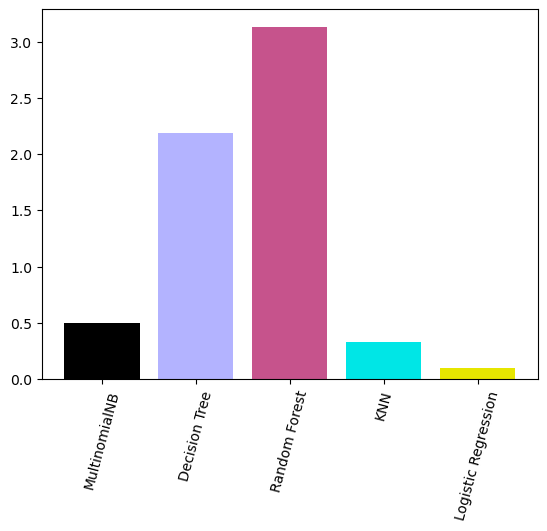

In [82]:
plt.bar(df_t["Model"], df_t["Time"] , color = ['black', '#b3b3ff', '#c6538c', '#00e6e6', '#e6e600'] )
plt.xticks(rotation=75)
plt.show()

# Build Model # TFIDF

# 1. MultinomialNB

In [83]:
%%time
from sklearn.naive_bayes import MultinomialNB
mnb_tfidf=MultinomialNB()
mnb_tfidf.fit(X_train_tfidf,Y_train)

Wall time: 599 ms


MultinomialNB()

In [84]:
%%time
y_pred_mnb_tfidf = mnb_tfidf.predict(X_test_tfidf)
y_pred_mnb_tfidf

Wall time: 298 ms


array([5, 5, 5, ..., 5, 5, 5], dtype=int64)

In [85]:
accuracy_score(Y_test , y_pred_mnb_tfidf)

0.650111119581088

In [86]:
pd.crosstab(Y_test, y_pred_mnb_tfidf, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,1408,0,1,2,14140
2,88,12,2,5,8812
3,34,0,41,14,12634
4,16,0,0,228,23894
5,12,2,2,11,109179


<AxesSubplot:xlabel='Score', ylabel='Count'>

<AxesSubplot:xlabel='Score', ylabel='Count'>

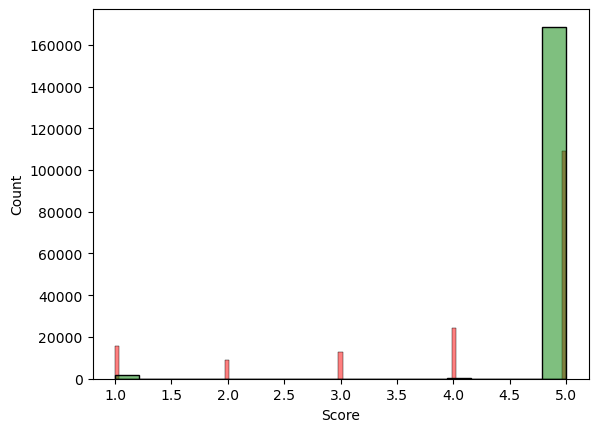

In [87]:
sns.histplot(Y_test,color='r',alpha=0.5)
sns.histplot(y_pred_mnb_tfidf,color='g',alpha=0.5)

# 2. Decision Tree classifier

In [88]:
%%time
from sklearn.tree import DecisionTreeClassifier
dtc_tfidf=DecisionTreeClassifier()
dtc_tfidf.fit(X_train_tfidf,Y_train)

Wall time: 54min 32s


DecisionTreeClassifier()

In [89]:
%%time
y_pred_dtc_tfidf = dtc_tfidf.predict(X_test_tfidf)
y_pred_dtc_tfidf

Wall time: 747 ms


array([5, 4, 5, ..., 5, 5, 5], dtype=int64)

In [90]:
accuracy_score(Y_test , y_pred_dtc_tfidf)

0.7537132704339821

In [91]:
pd.crosstab(Y_test, y_pred_dtc_tfidf, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,10061,1007,868,829,2786
2,1348,4023,804,745,1999
3,993,778,6314,1525,3113
4,892,668,1384,12429,8765
5,2405,1389,2367,7336,95709


<AxesSubplot:xlabel='Score', ylabel='Count'>

<AxesSubplot:xlabel='Score', ylabel='Count'>

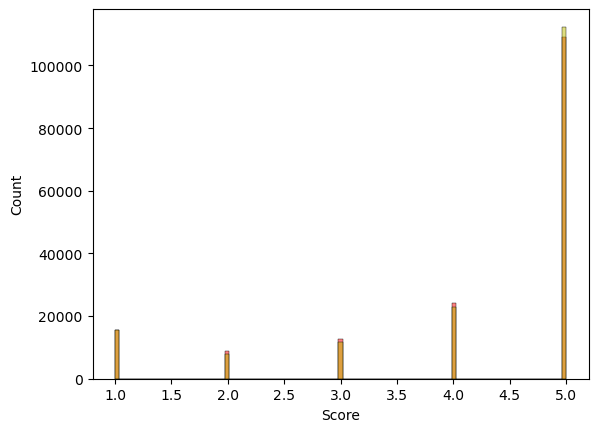

In [92]:
sns.histplot(Y_test,color='r',alpha=0.5)
sns.histplot(y_pred_dtc_tfidf,color='y',alpha=0.5)

# 3. Random Forest Classifier

In [93]:
%%time
from sklearn.ensemble import RandomForestClassifier
rfc_tfidf=RandomForestClassifier()
rfc_tfidf.fit(X_train_tfidf,Y_train)

Wall time: 2h 12min 14s


RandomForestClassifier()

In [94]:
%%time
y_pred_rfc_tfidf = rfc_tfidf.predict(X_test_tfidf)
y_pred_rfc_tfidf

Wall time: 32.5 s


array([5, 5, 5, ..., 5, 5, 5], dtype=int64)

In [95]:
accuracy_score(Y_test , y_pred_rfc_tfidf)

0.795076728217337

In [96]:
pd.crosstab(Y_test, y_pred_rfc_tfidf, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,8758,17,24,5,6747
2,486,3333,70,31,4999
3,192,18,5066,86,7361
4,55,3,52,9351,14677
5,67,2,16,39,109082


<AxesSubplot:xlabel='Score', ylabel='Count'>

<AxesSubplot:xlabel='Score', ylabel='Count'>

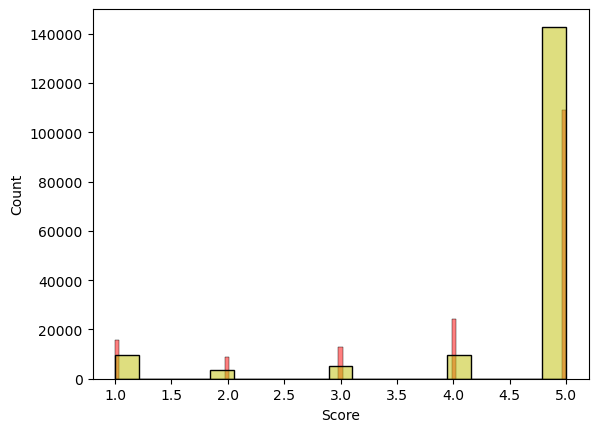

In [97]:
sns.histplot(Y_test,color='r',alpha=0.5)
sns.histplot(y_pred_rfc_tfidf,color='y',alpha=0.5)

# 4. Logistic Regression

In [98]:
%%time
from sklearn.linear_model import LogisticRegression
lr_tfidf=LogisticRegression()
lr_tfidf.fit(X_train_tfidf,Y_train)

Wall time: 1min 28s


LogisticRegression()

In [99]:
%%time
y_pred_lr_tfidf = lr_tfidf.predict(X_test_tfidf)
y_pred_lr_tfidf

Wall time: 165 ms


array([5, 3, 5, ..., 3, 5, 5], dtype=int64)

In [100]:
accuracy_score(Y_test , y_pred_lr_tfidf) 

0.7578707260008092

In [101]:
pd.crosstab(Y_test, y_pred_lr_tfidf, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,11270,1088,672,320,2201
2,2452,2487,1416,587,1977
3,1229,1053,4582,2072,3787
4,549,274,1530,7417,14368
5,1036,261,887,3533,103489


<AxesSubplot:xlabel='Score', ylabel='Count'>

<AxesSubplot:xlabel='Score', ylabel='Count'>

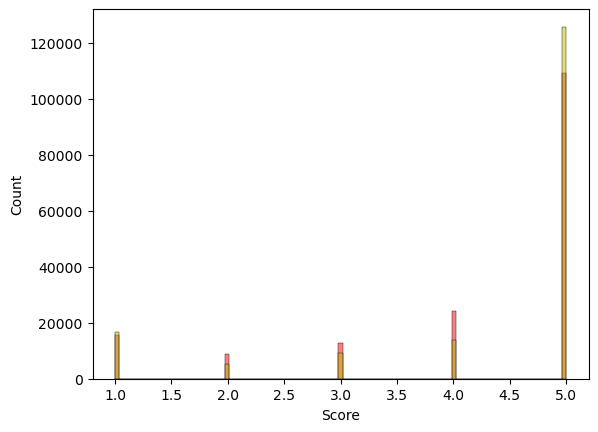

In [102]:
sns.histplot(Y_test,color='r',alpha=0.5)
sns.histplot(y_pred_lr_tfidf,color='y',alpha=0.5)

# 5. KNN

In [103]:
%%time
from sklearn.neighbors import KNeighborsClassifier
knc_tfidf=KNeighborsClassifier()
knc_tfidf.fit(X_train_tfidf,Y_train)

Wall time: 158 ms


KNeighborsClassifier()

In [104]:
%%time
y_pred_knc_tfidf = knc_tfidf.predict(X_test_tfidf)
y_pred_knc_tfidf

Wall time: 1h 23min 30s


array([5, 1, 5, ..., 5, 5, 5], dtype=int64)

In [105]:
accuracy_score(Y_test , y_pred_knc_tfidf)

0.7325565713012425

In [106]:
pd.crosstab(Y_test, y_pred_knc_tfidf, rownames=['Actual'], colnames=['Predicted'])

Predicted,1,2,3,4,5
Actual,,,,,
1,6249,448,411,351,8092
2,576,2554,296,318,5175
3,434,312,3828,578,7571
4,365,247,509,6903,16114
5,791,437,723,1861,105394


<AxesSubplot:xlabel='Score', ylabel='Count'>

<AxesSubplot:xlabel='Score', ylabel='Count'>

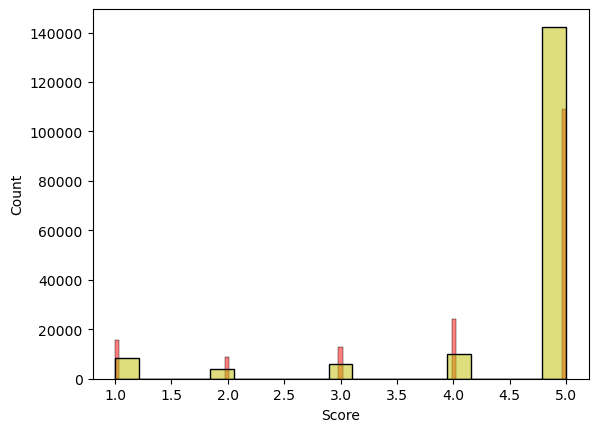

In [107]:
sns.histplot(Y_test,color='r',alpha=0.5)
sns.histplot(y_pred_knc_tfidf,color='y',alpha=0.5)